# LSST Solar System Processing Example

### Algorithm: 

Based on HelioLinC (Holman et al. 2018) we transform topocentric observations to heliocentric states assuming a distance and radial velocity.
The resulting 3D positions are collected into tracklets. Tracklets contain at least two observations and can, thus, be used to create velocity vectors.
A tracklet + velocity vector is called an "arrow". 
Arrows are propagated to a common epoch using spiceypy's 2body propagator, and then clustered using dbscan.

### Implementation:
S. Eggl 20191215
    

In [1]:
# Solar System Processing functions
import lsstssp as ls

#Accelerators
import numpy as np
import numba

#Database
import pandas as pd

# External API's
from astroquery.jplhorizons import Horizons
from astroquery.jplsbdb import SBDB

#Orbital Dynamics
import spiceypy as sp

# Clustering
import scipy.spatial as scsp
import sklearn.cluster as cluster

#Plotting
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm

from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d

import plotly.graph_objects as go
import seaborn as sns
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 40, 'linewidths':0}

#Timing
import time
#%matplotlib inline


In [2]:
def plot_clusters(data, algorithm, args, kwds):
    """Cluster and plot data with skit learn algorithm """
    #start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    #end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    plt.figure(dpi=300)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    plt.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
    frame = plt.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=24)
    #plt.text(-0.5, 0.7, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=14)

In [3]:
def plot_clusters3d(data, dims, algorithm, args, kwds):
    """Cluster and plot multi dimensional data with skit learn algorithm
        Plotting is done in 3D only,"""
    #start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    #end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    
    fig=plt.figure(dpi=300,figsize=(20,14))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter3D(data.T[dims[0]], data.T[dims[1]], data.T[dims[2]], c=colors)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    frame = plt.gca()
    #frame.axes.get_xaxis().set_visible(False)
    #frame.axes.get_yaxis().set_visible(False)
    
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=22)
    #plt.text(-0.5, 0.7, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=10)

In [4]:
def plot_orbits3d(df, xlims, ylims, zlims):
    """Orbit plot in 3D,"""
    palette = sns.color_palette('deep', np.unique(df['objId']).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in df['objId']]
    
    fig=plt.figure(dpi=300,figsize=(20,14))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter3D(df['x'], df['y'], df['z'], c=colors)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    frame = plt.gca()

    if(xlims != []):
        ax.set_xlim(xlims[0],xlims[1])
    if(ylims != []):
        ax.set_ylim(ylims[0],ylims[1])
    if(zlims != []):
        ax.set_zlim(zlims[0],zlims[1])    
    
    plt.title('Orbits', fontsize=22)
    #plt.text(-0.5, 0.7, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=10)

In [5]:
def plot_positions3d(t,x,y,z,*args,**kwargs):
    """Plot x,y,z positions in 3D with color coding (time).
    
    Parameters:
    -----------
    t ... time array
    x ... array containing x coordinates
    y ... array containing t coordinates
    z ... array containing z coordinates
    
    Kwargs:
    -------
    xlim, ylim, zlim ... [min,max] ranges for x,y and z axes
    """
#t = dt[:]
#x, y, z = xp[:,0], xp[:,1], xp[:,2]

    options = {'xlim' : [], 'ylim' : [] }

    options.update(kwargs)

    data=[go.Scatter3d(x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=3,
            color=t,                # set color to an array/list of desired values
            colorscale='Viridis',   # choose a colorscale
            opacity=0.8
                    ))]

    layout = go.Layout(
        xaxis=dict(range=options['xlim']),
        yaxis=dict(range=options['ylim'])
 #       zaxis=dict(range=options['zlim'])
                  )

    fig = go.Figure(data=data, layout=layout)

# tight layout
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()

In [6]:
def metrics(df,pairs,cluster):
    """Metrics for the succes of LSSTSSP arrow generation and clustering of SSO observations.
    
    Parameters:
    -----------
    df      ... pandas dataframe with observations
    pairs   ... list of pairs of observations [obsid1,obsid2] linked into arrows
    cluster ... output of clustering algorithm (sklearn.cluster)
    
    Returns:
    --------
    n_obj               ... number of SSOs/asteroids in observations file 
    n_clusters          ... number of clusters found by clustering algorithm (including garbage cluster with index -1)
    perfect_clusters    ... fraction of perfect clusters that contain all observations of one object only 
    pure_clusters       ... fraction of clusters that contain observations of one object 
    impure_clusters     ... fraction of clusters that contain mised observations (more than one object)     
    completeness        ... fraction of objects discovered
    obj_not_found       ... list of objects not found 
    unique_labels       ... unique cluster labels 
    obj_in_cluster      ... list of objects in per cluster 
    obs_in_cluster      ... list of observations in cluster
    """
    #cluster names (beware: -1 is the cluster of all the leftovers)
    unique_labels = np.unique(cluster.labels_)
    #number of clusters
    n_clusters = len(unique_labels)
    
    #which objects do observations in pairs (tracklets) belong to
    p = np.array(pairs)              
    pair_obj = np.array([df['obj'][p[:,0]].values,df['obj'][p[:,1]].values]).T
    #which pairs (tracklets) belong to the same objects?
    correct = correct_pairs(df,pairs)
    #if a pair is correct pair_ok==1 otherwise 0
    pair_ok = np.zeros(len(cluster.labels_))
    pair_ok[correct] = 1

    #group original observation dataframe by objects
    gdf=df.groupby(['obj'])
    
    #cluster contains all observations of one object
    perfect_clusters =0 
    #cluster contains observations of one object only
    pure_clusters = 0
#     #cluster contains all observations of one object + pollution
#     valid_clusters = 0
    #cluster contains all observations of more than one object
    impure_clusters = 0
    
    obs_in_cluster=[]
    obs_in_cluster_add=obs_in_cluster.append
    
    obj_in_cluster=[]
    obj_in_cluster_add=obj_in_cluster.append
    #cluster contains 
    for u in unique_labels:
        #which indices in pair array appear in a given cluster?
        idx = np.where(cluster.labels_ == u)[0]
        #find unique object ids in cluster
        uniq_obj=np.unique(pair_obj[idx])
        
        obj_in_cluster_add(uniq_obj)
        
        #which observations are in this cluster
        obs_in_cluster_add(np.unique(p[idx].flatten()))
        
        if (np.sum(pair_ok[idx]) == len(idx)):
            perfect_clusters += 1
        elif (len(uniq_obj) == 1):
            pure_clusters += 1 
        elif (len(uniq_obj) > 1):
            impure_clusters += 1 
         
        
            #find unique observation ids in cluster
            uniq_obs=np.rint(np.unique(p[idx]))
      
            #find observation ids linked with objects
#             valid=False
#             for obj in uniq_obj:
#                 #print(int(obj))
#                 #obs_idx=gdf.indices[int(obj)+1]
#                 obs_obj=gdf.indices[obj]
#                 #print('obs_obj',obs_obj)
#                 #print('uniq_obs',uniq_obs)
# #                 print('***************')
# #                 print('cluster',u,'obj', obj)
# #                 print(np.isin(obs_obj,uniq_obs))
# #                 print(all(np.isin(obs_obj,uniq_obs)))
#                 if(all(np.isin(obs_obj,uniq_obs))):
#                     valid=True
#             if(valid):
#                 valid_clusters += 1    
    #number of unique found objects in clusters vs number of actual objects
    #print((np.hstack(obj_in_cluster[1:])))
    n_obj=len(gdf)
    uoc=np.unique(np.hstack(obj_in_cluster[1:]))
    completeness=len(uoc)/n_obj*100
    #objects not found
    obj_in_sample=list(gdf.indices.keys())
    obj_not_found=np.ma.array(obj_in_sample, mask=np.isin(obj_in_sample,uoc))
    
    return [n_obj, n_clusters, perfect_clusters, pure_clusters, impure_clusters, completeness, obj_not_found, unique_labels, obj_in_cluster, obs_in_cluster]                     


In [7]:
def correct_pairs(df,pairs):
    """Which pairs are actually good, i.e. which tracklets are real?
    
    Parameters:
    -----------
    df      ... pandas dataframe with observations
    pairs   ... list of pairs of observations [obsid1,obsid2] linked into arrows
    
    Returns:
    --------
    correct ... logical array (dimension of pairs[:,0])
    """
    p=np.array(pairs)
    #find out which pairs are actually good
    pair_obj=np.array([df['obj'][p[:,0]].values,df['obj'][p[:,1]].values]).T
    #print(pair_obj)
    #correct=np.where(df['obj'][p[:,0]].values == df['obj'][p[:,1]].values)
    correct=np.where(pair_obj[:,0] == pair_obj[:,1])
    return correct[0]

In [8]:
def observations_in_cluster(df,pairs,cluster):
    """List observations in each cluster.
    
    Parameters:
    -----------
    df      ... pandas dataframe with observations
    pairs   ... list of pairs of observations [obsid1,obsid2] linked into arrows
    cluster ... output of clustering algorithm (sklearn.cluster)
    
    Returns:
    --------
    obs_in_cluster ... list of observations in each cluster
    """
    #cluster names (beware: -1 is the cluster of all the leftovers)
    unique_labels = np.unique(cluster.labels_)
    #number of clusters
    n_clusters = len(unique_labels)
    
    #which objects do observations in pairs (tracklets) belong to
    p = np.array(pairs)              
    
    obs_in_cluster=[]
    obs_in_cluster_add=obs_in_cluster.append
    
    #cluster contains 
    for u in unique_labels:
        #which indices in pair array appear in a given cluster?
        idx = np.where(cluster.labels_ == u)[0]
        
        #which observations are in this cluster
        obs_in_cluster_add(np.unique(p[idx].flatten()))
    
    return obs_in_cluster, unique_labels

In [9]:
def objects_in_cluster(df,pairs,cluster):
    """List observations in each cluster.
    
    Parameters:
    -----------
    df      ... pandas dataframe with observations
    pairs   ... list of pairs of observations [obsid1,obsid2] linked into arrows
    cluster ... output of clustering algorithm (sklearn.cluster)
    
    Returns:
    --------
    obs_in_cluster ... list of objects in each cluster
    """
    #cluster names (beware: -1 is the cluster of all the leftovers)
    unique_labels = np.unique(cluster.labels_)
    #number of clusters
    n_clusters = len(unique_labels)
    
    #which objects do observations in pairs (tracklets) belong to
    p = np.array(pairs)              
    pair_obj = np.array([df['obj'][p[:,0]].values,df['obj'][p[:,1]].values]).T
    
    obj_in_cluster=[]
    obj_in_cluster_add=obj_in_cluster.append
    #cluster contains 
    for u in unique_labels:
        #which indices in pair array appear in a given cluster?
        idx = np.where(cluster.labels_ == u)[0]
        #find unique object ids in cluster
        uniq_obj=np.unique(pair_obj[idx])
        obj_in_cluster_add(uniq_obj)
        
    return obj_in_cluster, unique_labels

In [10]:
def observations_in_arrows(df,goodpairs,*args,**kwargs):
    """Find which observations go into an arrow.
    
    Parameters:
    -----------
    df          ... pandas dataframe with observations
    goodpairs   ... filtered list of pairs of observations [obsid1,obsid2] linked into arrows
    
    Returns:
    --------
    df_obs_in_arrows ... pandas dataframe where the index is the arrow id 
                         and the first and second column are the first and second observation 
                         that go into the respective arrow.
    """
    df_obs_in_arrows=pd.DataFrame(goodpairs,**kwargs)
    return df_obs_in_arrows

In [62]:
def df2difi(df,index_name,value_name):
    """Map pandas dataframe with lists of values to THOR difi format"""

    difi=df[value_name].apply(pd.Series) \
    .merge(df, right_index = True, left_index = True) \
    .drop([value_name], axis = 1) \
    .melt(id_vars = [index_name], value_name = value_name) \
    .drop("variable", axis = 1) \
    .dropna() \
    .sort_values(by=[index_name]) \
    .astype('int') \
    .reset_index(drop=True)
    
    return difi

## SIMULATED OBSERVATIONS 
(skip if LSST observation file is used).

1) Select observer location, observed asteroids and duration of observations.

In [11]:
observer_location='I11'
asteroids=[1221,311,367943,10,2]

tstart='2020-06-01'
tstop='2020-08-01'
#time between observations
dt_obs='1d'

2) Query JPL Horizons for the corresponding ephemeris and state vectors.

In [12]:
#Get asteroid observations
obs=[]
obs_app=obs.append
for i in asteroids:
    obj = Horizons(id=i, location=observer_location,
                epochs={'start':tstart, 'stop':tstop,
                        'step':dt_obs})
    eph = obj.ephemerides()
    arr=len(eph['RA'])
    num=np.full(arr,i) 
    obs_app(np.array([num,eph['datetime_jd'],eph['RA'],eph['DEC']]))
    print(obj.vectors()[0]['targetname'])

1221 Amor (1932 EA1)
311 Claudia
367943 Duende (2012 DA14)
10 Hygiea
2 Pallas


In [13]:
#Get asteroid states at observation dates
coo=[]
coo_app=coo.append

for i in asteroids:
    obj = Horizons(id=i, location='@Sun',
                epochs={'start':tstart, 'stop':tstop,
                        'step':dt_obs})
    
    coo_app(np.array([num,np.array(obj.vectors()['x','y','z'])]))

coo2=[]
for i in np.array(obj.vectors(refplane='earth')['x','y','z']):
    coo2.append(list(i))

coo3=np.array(coo2)
   

In [14]:
obj.vectors();

In [15]:
# Get observer locations (caution: choose the right plane of reference and direction of the vectors!)
observer_sun=Horizons(id='Sun', location=observer_location, id_type='majorbody',
                epochs={'start':tstart, 'stop':tstop,
                        'step':dt_obs})
sunxyz=(observer_sun.vectors(refplane='earth'))['x','y','z']
obsxyz=sunxyz.as_array()

In [16]:
# Convert observations and observer states to pandas dataframe
obsa=np.array(obs)
dfradec=pd.DataFrame(np.hstack(obsa).T,columns=['objId','time','RA','DEC'])
dfradec['objId']=dfradec['objId'].astype('int')
dfxyz=pd.DataFrame(obsxyz.data,columns=['x','y','z'])*(-1)
dfxyz2=dfxyz
for i in range(len(asteroids)):
       dfxyz2=pd.concat([dfxyz2,dfxyz])

In [17]:
dfxyz2.reset_index(drop=True);

In [18]:
dfobs=(dfradec.join(dfxyz2.reset_index(drop=True))).rename(columns={'x':'x_obs','y':'y_obs','z':'z_obs'})

## If LSST observations are used from file uncomment the following cell:

In [19]:
#dfobs=pd.read_csv('../data/lsst_sso_534_obs.tar.gz',sep='\s+',nrows=1200)

In [20]:
# check observation dataframe: must contain time, RA, DEC, x_obs, y_obs, z_obs
dfobs

,objId,time,RA,DEC,x_obs,y_obs,z_obs
0,1221,2459001.5,321.88826,4.64335,-0.335257,-0.878086,-0.380672
1,1221,2459002.5,322.01022,4.73959,-0.319256,-0.883232,-0.382903
2,1221,2459003.5,322.12156,4.83116,-0.303165,-0.888129,-0.385025
3,1221,2459004.5,322.22221,4.91796,-0.286990,-0.892776,-0.387038
4,1221,2459005.5,322.31212,4.99991,-0.270735,-0.897170,-0.388943
...,...,...,...,...,...,...,...
305,2,2459058.5,283.23352,19.64265,0.584032,-0.762169,-0.330411
306,2,2459059.5,283.06418,19.49853,0.597738,-0.753039,-0.326452
307,2,2459060.5,282.89830,19.35105,0.611274,-0.743696,-0.322401
308,2,2459061.5,282.73600,19.20031,0.624637,-0.734145,-0.318260


In [21]:
dfobs.keys()

Index(['objId', 'time', 'RA', 'DEC', 'x_obs', 'y_obs', 'z_obs'], dtype='object')

In [22]:
# Convert observations to final pandas dataframe
df=dfobs[['objId','time','RA','DEC','x_obs','y_obs','z_obs']].rename(columns={'objId':'obj'})

In [61]:
#save a csv output 
df.to_csv('observations_database.csv')

In [23]:
#Get asteroid states near the center of the observation arc
coo=[]
coo_app=coo.append

tstart='2020-07-01'
tstop='2020-07-02'
dt_obs="2d"
for i in asteroids:
    obj = Horizons(id=i, location='@Sun',
                epochs={'start':tstart, 'stop':tstop,
                        'step':dt_obs})
    
    coo_app(obj.vectors(refplane='earth'))

horizon_states=np.array(coo)

In [24]:
horizon_states;

### Let's build our KDTree and create arrows 


Run a quick test to see if the arrow generation was successul:

In [25]:
r=2.6
drdt=0.0001
tref=df['time'].median()
cr=0.1

[xarrow, varrow, tarrow, goodpairs]=ls.create_heliocentric_arrows(df,r,drdt,tref,cr,lttc=False)

/Users/eggl/Documents/UW2018/dirac/lsst_ssp/lsst_ssp/linking/notebooks/lsstssp.py:90: NumbaPerformanceWarning:

np.vdot() is faster on contiguous arrays, called on (array(float64, 1d, A), array(float64, 1d, A))



In [26]:
xarrow

array([[ 0.44885208, -2.54550752,  0.30276939],
       [ 1.51712697, -2.10124025, -0.21921694],
       [ 1.9022924 , -1.57506147, -0.81188981],
       ...,
       [ 1.90916003, -1.56804157, -0.8090326 ],
       [ 0.71335742, -2.48556774,  0.26887588],
       [-0.20215655,  2.36733263,  1.05722716]])

Plot the arrow positions for the test asteroids

In [27]:
plot_positions3d(tarrow[:],xarrow[:,0], xarrow[:,1], xarrow[:,2],xlim=[-3,3],ylim=[-3,3])

### Now propagate the arrows to the same time (the center of the t array)

In [28]:
[xp,vp,dt] = ls.propagate_arrows_2body(xarrow,varrow,tarrow,df['time'].median())

In [29]:
df['time'].median()

2459032.0

In [30]:
plot_positions3d(dt[:],xp[:,0], xp[:,1], xp[:,2],xlim=[-3,3],ylim=[-3,3])

### Let's cluster!

In [31]:
# DBSCAN clustering parameters
eps=0.01
min_samples=5

In [32]:
# Create 6D array of tracklets
# xpvp=np.hstack((xp,varrown))
xpvp=np.hstack((xp,vp))

In [33]:
#Scale arrow speed to unit lenght to facilitate clustering in 6D space
# vn=np.linalg.norm(varrow,axis=1)
# varrown=[v/np.linalg.norm(v) for v in varrow]

Cluster in propagated position space (3D), Black dots are not clustered (garbage)

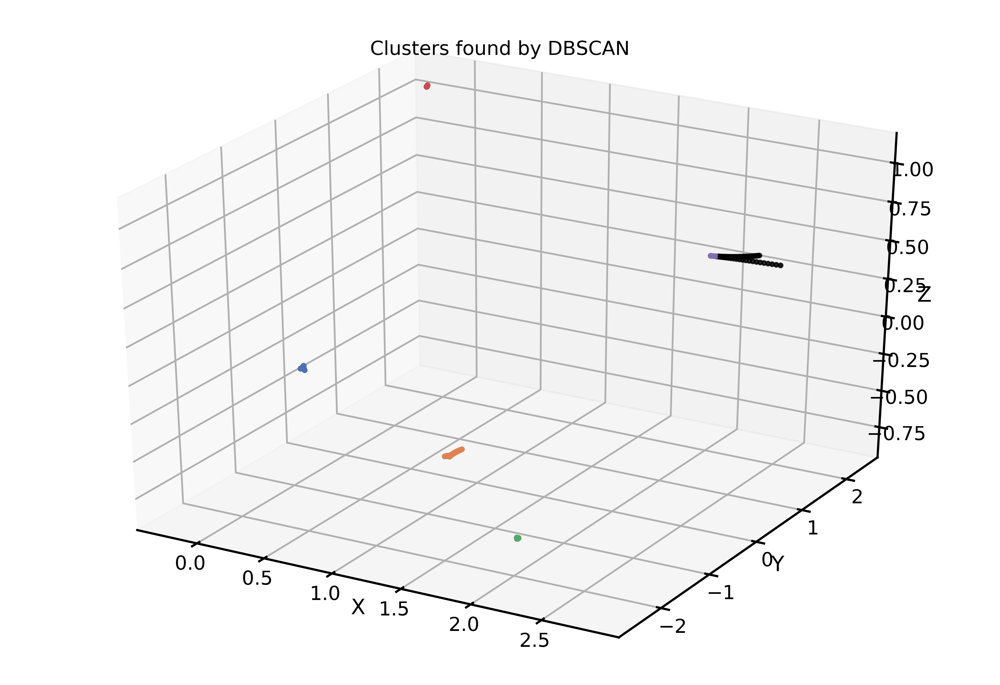

In [60]:
plot_clusters3d(xp, [0,1,2], cluster.DBSCAN, (), {'eps':eps,'min_samples':min_samples})

Cluster in propagated position and velocity space (6D)


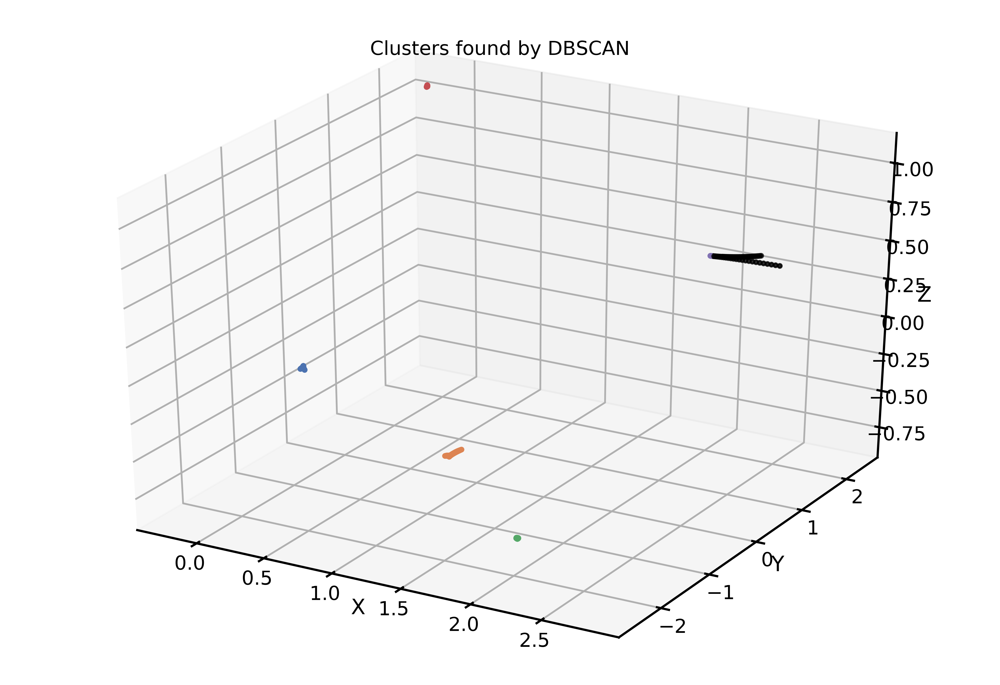

In [35]:
# Heliocentric position space clustering
plot_clusters3d(xpvp,[0,1,2], cluster.DBSCAN, (), {'eps':eps,'min_samples':min_samples})

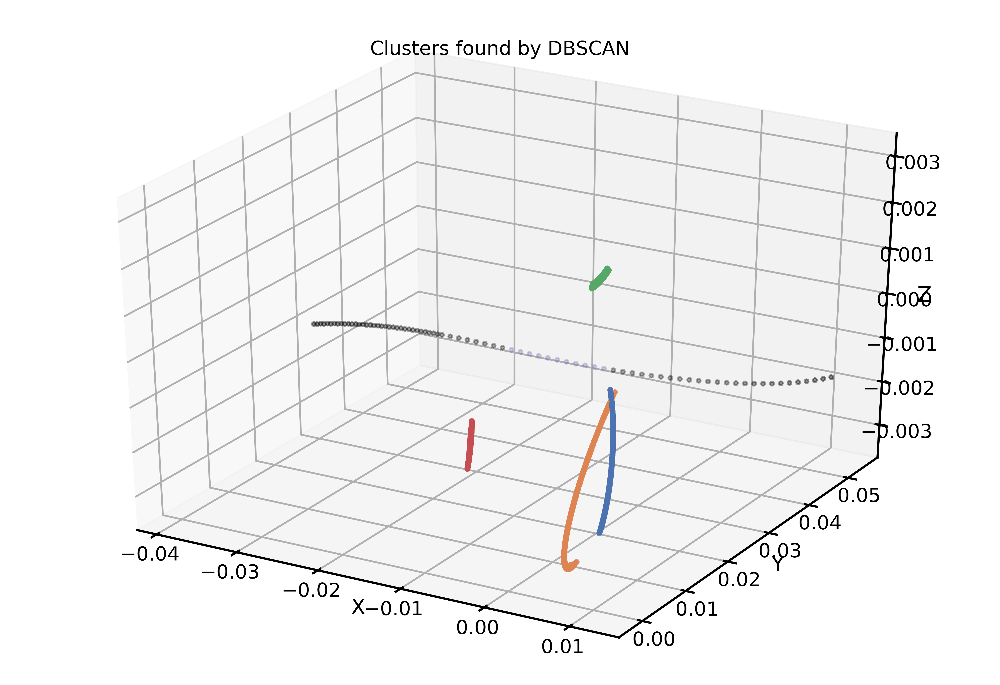

In [36]:
# Velocity clustering
plot_clusters3d(xpvp,[3,4,5], cluster.DBSCAN, (), {'eps':eps,'min_samples':min_samples})

## Try multiple heliocentric radii for clustering

In [37]:
# range of radii
rall=np.arange(0.8,4,0.4)

# clustering radius for trackelt creation based on how far an object can move during one night 
dt=1
cr=50/150e6*86400*dt

# only one raidal velocity value [au/d]
drdt=0.001

# reference epoch for propagation
tref=df['time'].median()


xpall=[]
vpall=[]
dtall=[]

for r in rall:
    [xarrow, varrow, tarrow, goodpairs] = ls.create_heliocentric_arrows(df,r,drdt,tref,cr)
    [xp,vp,dt] = ls.propagate_arrows_2body(xarrow,varrow,tarrow,df['time'].median())
    
    xpall.append(xp)
    vpall.append(vp)
    dtall.append(dt)

Plot the propagated arrows as for each clustering radius. The red arrows show the actual states of the test asteroids. The blue circle represents the Earth's orbit.

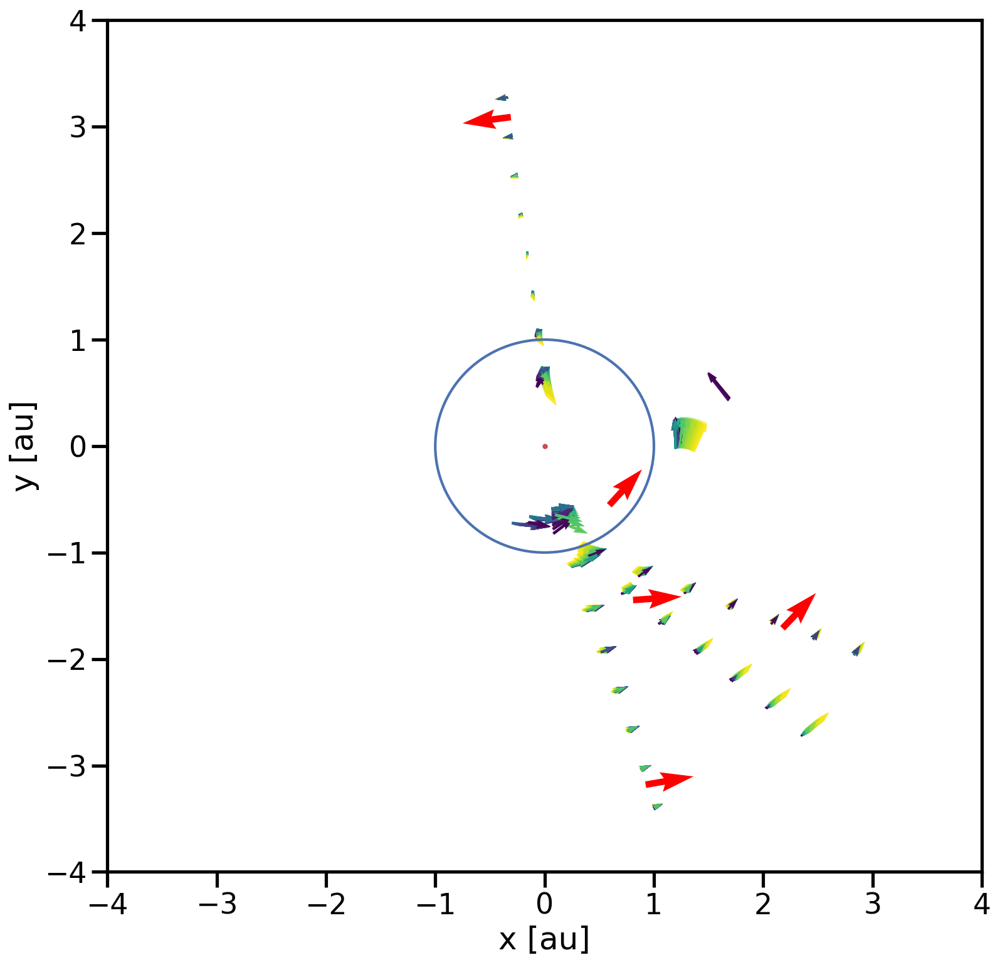

In [38]:
plt.figure(dpi=150,figsize=(12,12))

plt.scatter(0,0,s=4,c='r')
plt.xlabel('x [au]')
plt.ylabel('y [au]')

circle1=plt.Circle((0, 0), 1, color='b', fill=False)

for i in range(len(rall)):   
    plt.quiver(xpall[i][:,0],xpall[i][:,1],vpall[i][:,0],vpall[i][:,1],dtall[i],scale=0.7)


for i in range(len(asteroids)):
    plt.quiver(horizon_states[i][0][5],horizon_states[i][0][6],horizon_states[i][0][8],horizon_states[i][0][9],color='red')
    
plt.xlim(-4,4)
plt.ylim(-4,4)

plt.gcf().gca().add_artist(circle1)
plt.show()

heliocentric distance sampled [au]: 0.8
heliocentric distance sampled [au]: 1.2000000000000002
heliocentric distance sampled [au]: 1.6000000000000003
heliocentric distance sampled [au]: 2.0000000000000004
heliocentric distance sampled [au]: 2.4000000000000004
heliocentric distance sampled [au]: 2.8000000000000007
heliocentric distance sampled [au]: 3.200000000000001
heliocentric distance sampled [au]: 3.6000000000000005


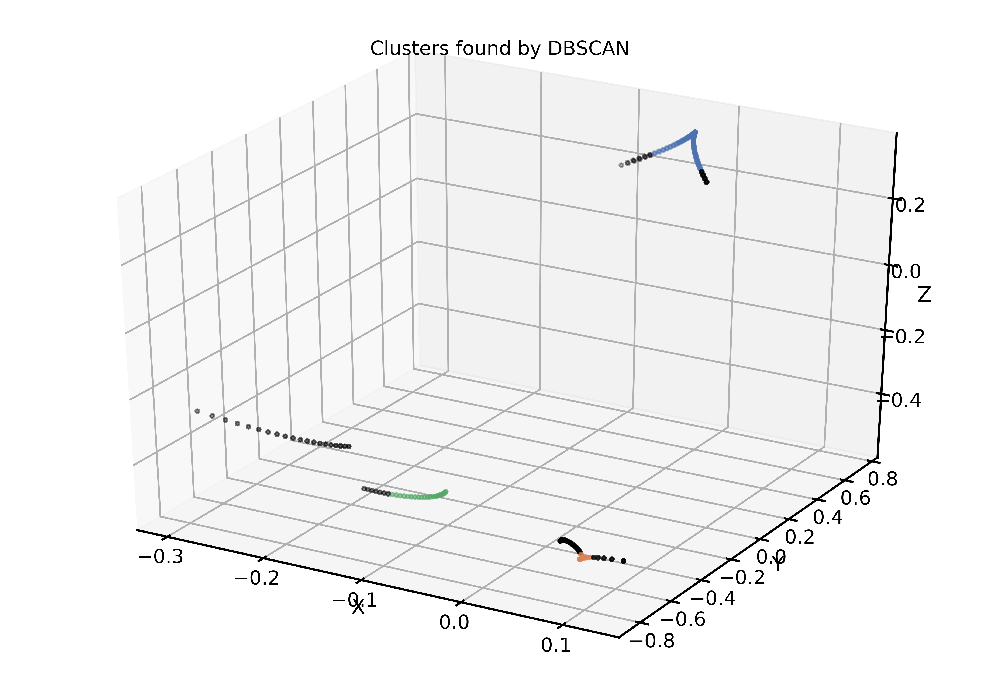

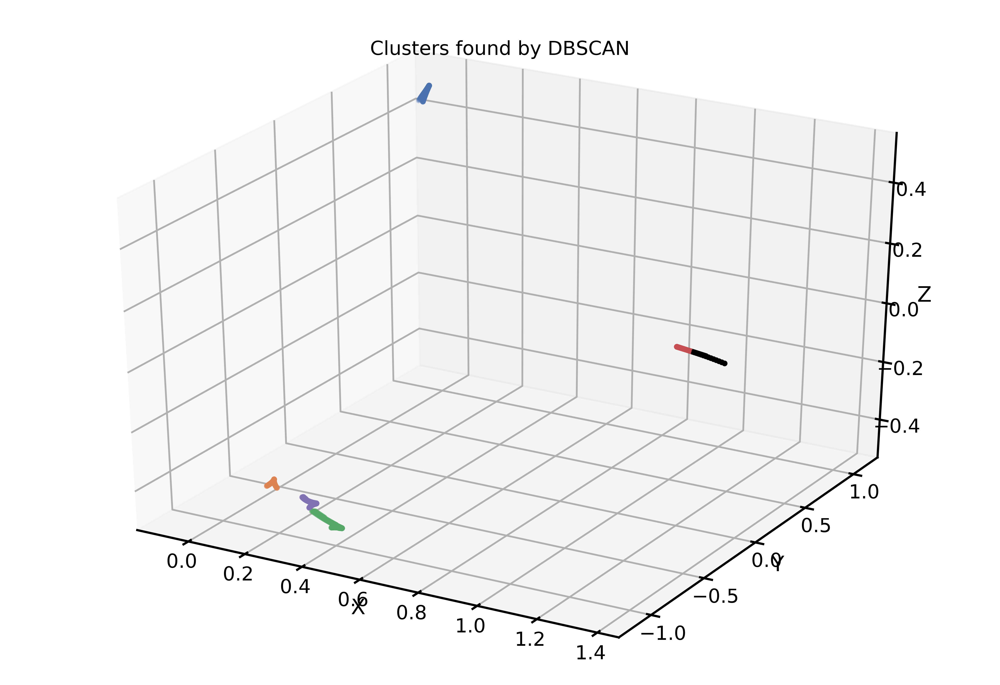

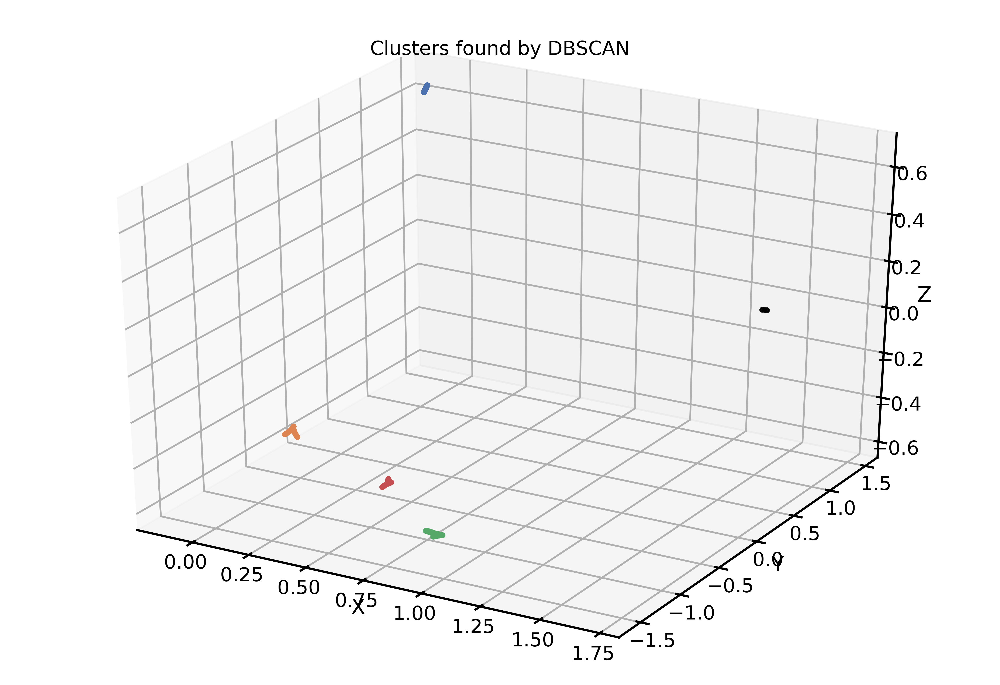

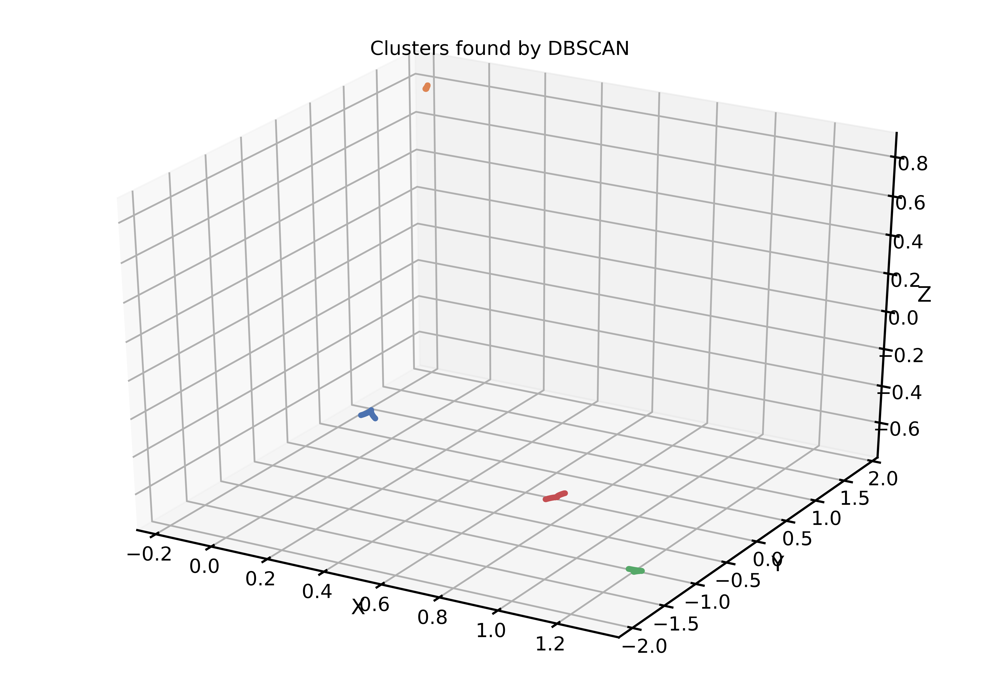

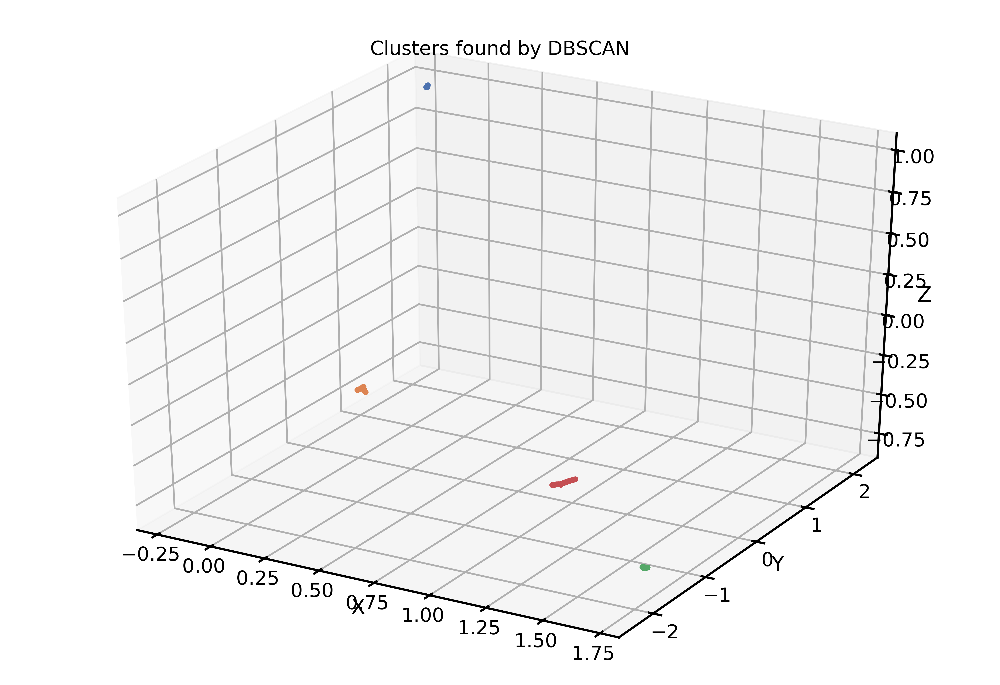

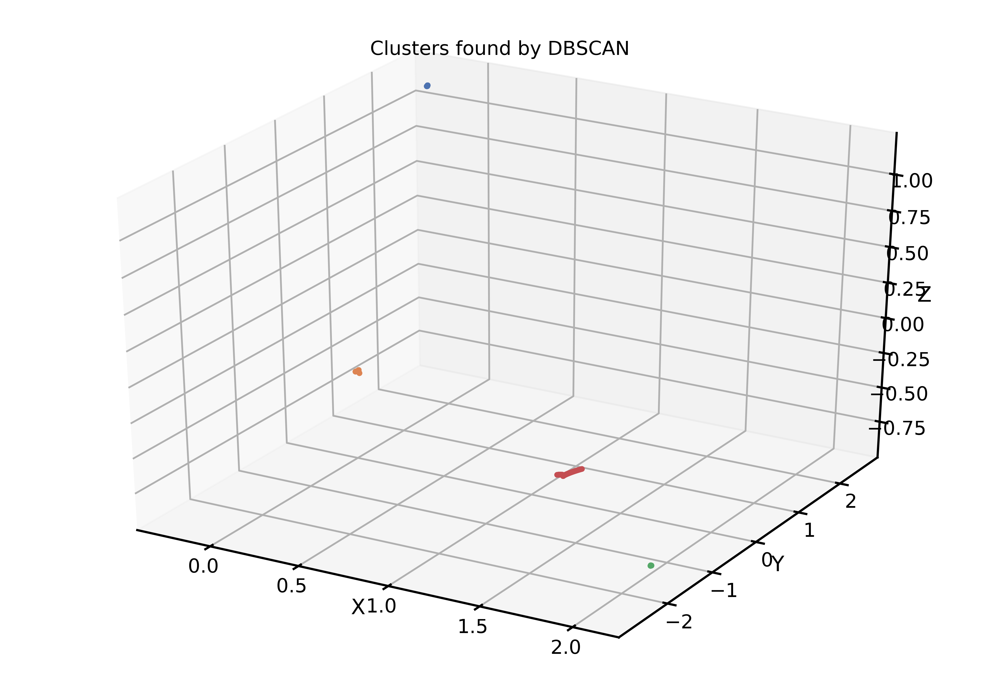

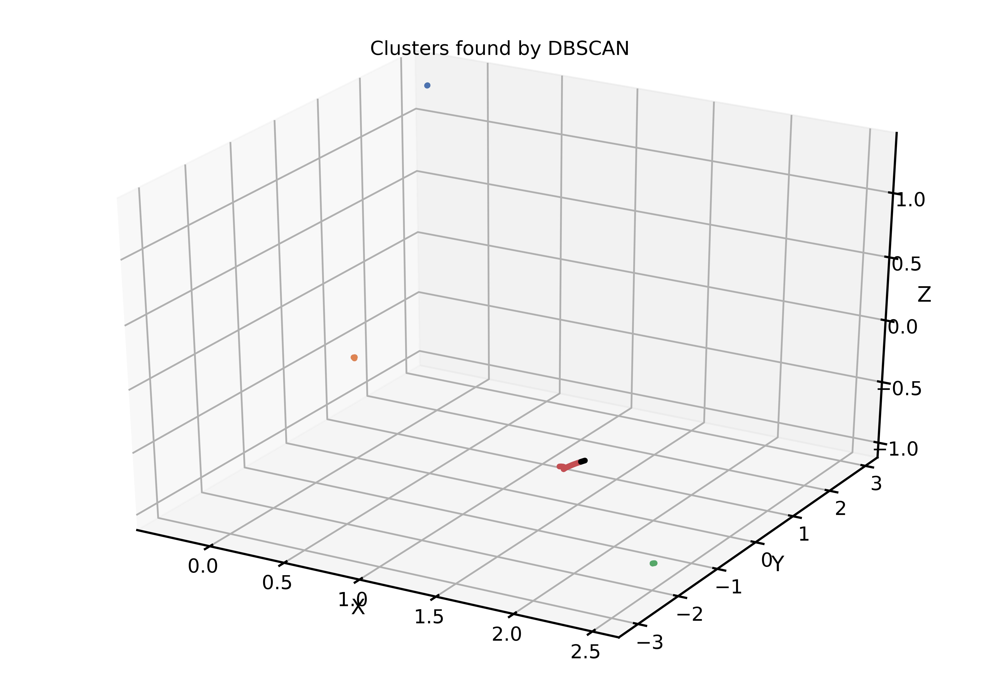

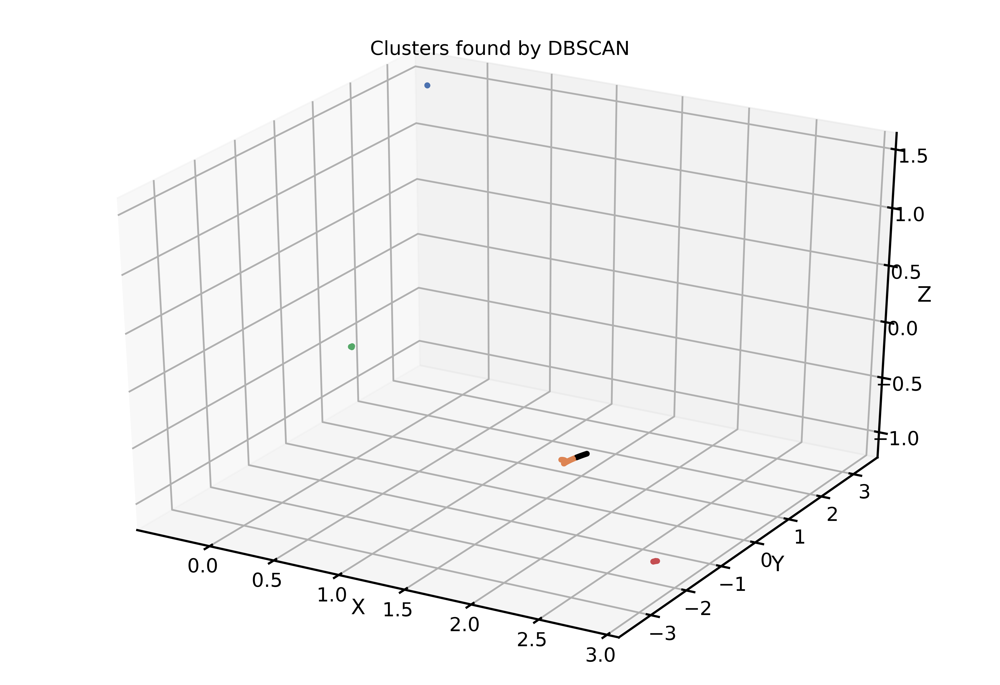

In [39]:
for i in range(len(rall)):  
    print('heliocentric distance sampled [au]:', rall[i])
    plot_clusters3d(xpall[i], [0,1,2], cluster.DBSCAN, (), {'eps':eps,'min_samples':min_samples})

### And in numbers ... 

In [40]:
r=2.6
drdt=0.001
tref=df['time'].median()
cr=0.1

[xarrow, varrow, tarrow, goodpairs] = ls.create_heliocentric_arrows(df,r,drdt,tref,cr)
[xp,vp,dt] = ls.propagate_arrows_2body(xarrow,varrow,tarrow,df['time'].median())

db=cluster.DBSCAN(eps=eps,min_samples=min_samples).fit(xp)

In [41]:
# Number of objects observed 
metrics(df,goodpairs,db)[0]

5

In [42]:
# Number of clusters (including garbage), 
metrics(df,goodpairs,db)[1]

6

In [43]:
# number of perfect clusters (all obs of a given obj in one cluster) 
metrics(df,goodpairs,db)[2]

6

In [44]:
# number of pure clusters (obs of only one object in a cluster if not perfect)
metrics(df,goodpairs,db)[3]

0

In [45]:
# number of impure clusters (obs of multiple objects in one cluster)
metrics(df,goodpairs,db)[4]

0

In [46]:
#Completeness [%] (fraction of all observed objects that have been collected into clusters)
metrics(df,goodpairs,db)[5]

100.0

In [47]:
#Missing objects
metrics(df,goodpairs,db)[6].compressed()

array([], dtype=int64)

In [48]:
# cluster labels: -1 is the garbage cluster
metrics(df,goodpairs,db)[7]

array([-1,  0,  1,  2,  3,  4])

### Observations in each arrow

In [49]:
# Find observations in each arrow
dfoia=observations_in_arrows(df,goodpairs,columns=['obs_t0','obs_t1'])

In [50]:
# Find corresponding entry in obs database
df.iloc[dfoia['obs_t0'][0]]

obj      2.000000e+00
time     2.459008e+06
RA       2.927207e+02
DEC      2.135195e+01
x_obs   -2.380008e-01
y_obs   -9.052001e-01
z_obs   -3.924216e-01
Name: 254, dtype: float64

### Observations in each cluster

In [51]:
#observations in each cluster
obs_in_cluster, labels = observations_in_cluster(df,goodpairs,db)

In [52]:
obs_in_cluster_df=pd.DataFrame(zip(labels,obs_in_cluster),columns=['clusterId','obsId'])

In [53]:
obs_in_cluster_df

,clusterId,obsId
0,-1,"[124, 125, 126, 127, 128, 129, 130, 131, 132, ..."
1,0,"[248, 249, 250, 251, 252, 253, 254, 255, 256, ..."
2,1,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,2,"[62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 7..."
4,3,"[186, 187, 188, 189, 190, 191, 192, 193, 194, ..."
5,4,"[146, 147, 148, 149, 150, 151, 152, 153, 154, ..."


In [63]:
obs2difi=df2difi(obs_in_cluster_df,'clusterId','obsId')

In [64]:
obs2difi.to_csv('obs_per_cluster.csv',index=False)

### Objects in each cluster

In [55]:
#object(s) in each cluster
obj_in_cluster, labels=objects_in_cluster(df,goodpairs,db)

In [56]:
labels

array([-1,  0,  1,  2,  3,  4])

In [57]:
obj_in_cluster_df=pd.DataFrame(zip(labels,obj_in_cluster), columns=['clusterId','objId'])

In [58]:
obj_in_cluster_df

,clusterId,objId
0,-1,[367943]
1,0,[2]
2,1,[1221]
3,2,[311]
4,3,[10]
5,4,[367943]


In [65]:
obj2difi=df2difi(obj_in_cluster_df,'clusterId','objId')

In [66]:
obj2difi.to_csv('obj_per_cluster.csv',index=False)